## Analysing the dataset

### Importing libraries

In [1]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns

# Library to split data
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.model_selection import cross_validate
from sklearn.metrics import make_scorer
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    ConfusionMatrixDisplay
)

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

### Defining functions

In [2]:
# Define the function to create the metrics
# 1- model: classifier
# 2- predictors: independent variables
# 3- target: dependent variable
def model_performance_classification_sklearn(model, predictors, target):
    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
        },
        index=[0],
    )

    return df_perf

### Extracting the dataset

#### Extracting training dataset

In [3]:
data_training = pd.read_csv(r'C:\Users\Nestor_Arias\OneDrive - EPAM\EPAM Projects\Repo\CHURN\customer_churn_dataset-training-master.csv')
data_training.head()

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,2.0,30.0,Female,39.0,14.0,5.0,18.0,Standard,Annual,932.0,17.0,1.0
1,3.0,65.0,Female,49.0,1.0,10.0,8.0,Basic,Monthly,557.0,6.0,1.0
2,4.0,55.0,Female,14.0,4.0,6.0,18.0,Basic,Quarterly,185.0,3.0,1.0
3,5.0,58.0,Male,38.0,21.0,7.0,7.0,Standard,Monthly,396.0,29.0,1.0
4,6.0,23.0,Male,32.0,20.0,5.0,8.0,Basic,Monthly,617.0,20.0,1.0


In [4]:
data_training.shape

(440833, 12)

In [5]:
# Dropping ID and ZIP Code in the dataset
data_training.drop(['CustomerID'], axis=1, inplace=True)

In [6]:
# Looking the missing values in each column
data_training.isnull().sum()

Age                  1
Gender               1
Tenure               1
Usage Frequency      1
Support Calls        1
Payment Delay        1
Subscription Type    1
Contract Length      1
Total Spend          1
Last Interaction     1
Churn                1
dtype: int64

In [7]:
data_training[data_training.isnull().any(axis=1)]

,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
199295,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
data_training.dropna(inplace=True)

In [9]:
# Converting data types
data_training = data_training.astype({
    "Gender":'category',
    "Subscription Type":'category',
    "Contract Length":'category',
    "Churn": 'category'
    })

In [10]:
data_training.shape

(440832, 11)

#### Extracting testing dataset

In [11]:
data_testing = pd.read_csv(r'C:\Users\Nestor_Arias\OneDrive - EPAM\EPAM Projects\Repo\CHURN\customer_churn_dataset-testing-master.csv')
data_testing.head()

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,1,22,Female,25,14,4,27,Basic,Monthly,598,9,1
1,2,41,Female,28,28,7,13,Standard,Monthly,584,20,0
2,3,47,Male,27,10,2,29,Premium,Annual,757,21,0
3,4,35,Male,9,12,5,17,Premium,Quarterly,232,18,0
4,5,53,Female,58,24,9,2,Standard,Annual,533,18,0


In [12]:
data_testing.shape

(64374, 12)

In [13]:
# Dropping ID and ZIP Code in the dataset
data_testing.drop(['CustomerID'], axis=1, inplace=True)

In [14]:
# Looking the missing values in each column
data_testing.isnull().sum()

Age                  0
Gender               0
Tenure               0
Usage Frequency      0
Support Calls        0
Payment Delay        0
Subscription Type    0
Contract Length      0
Total Spend          0
Last Interaction     0
Churn                0
dtype: int64

In [15]:
# Converting data types
data_testing = data_testing.astype({
    "Gender":'category',
    "Subscription Type":'category',
    "Contract Length":'category',
    "Churn": 'category'
    })

## Exploratory Data Analysis

### Exploring training data

In [16]:
profile = ProfileReport(
    data_training, 
    title = "Profiling Report - Train Dataset",
    dataset={
        "description": "CHURN Profiling Report for train dataset",
        "author": "Nestor Arias",
        "copyright_holder": "AI Caramba !!",
        "copyright_year": 2024
    }
)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Exploring testing data

In [17]:
profile = ProfileReport(
    data_testing, 
    title = "Profiling Report - Test Dataset",
    dataset={
        "description": "CHURN Profiling Report for test dataset",
        "author": "Nestor Arias",
        "copyright_holder": "AI Caramba !!",
        "copyright_year": 2024
    }
)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Bivariate analysis

#### Training Data

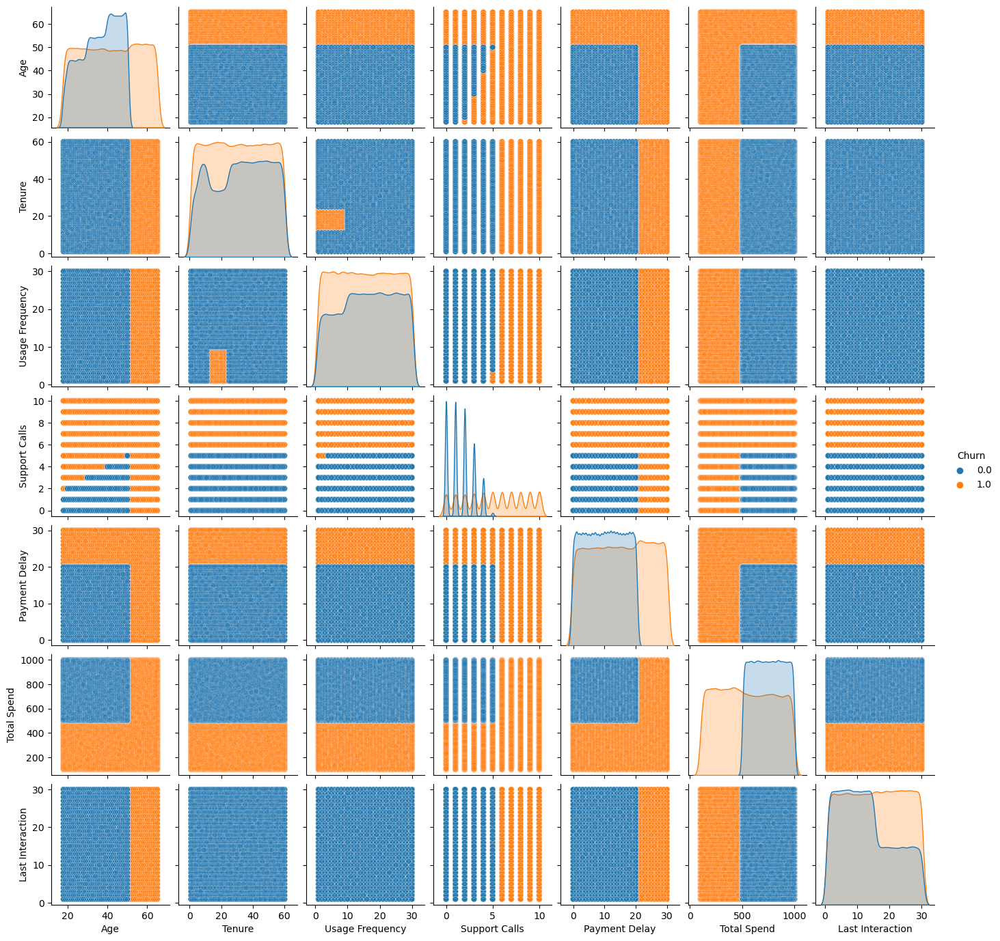

In [18]:
# Plot the list of columns which are numerical
sns.pairplot(data = data_training, diag_kind = "kde", aspect = 1, height = 2, hue = 'Churn', plot_kws = dict(alpha = 0.1))
plt.show()

- the CHURN segment is well defined

#### Testing Data

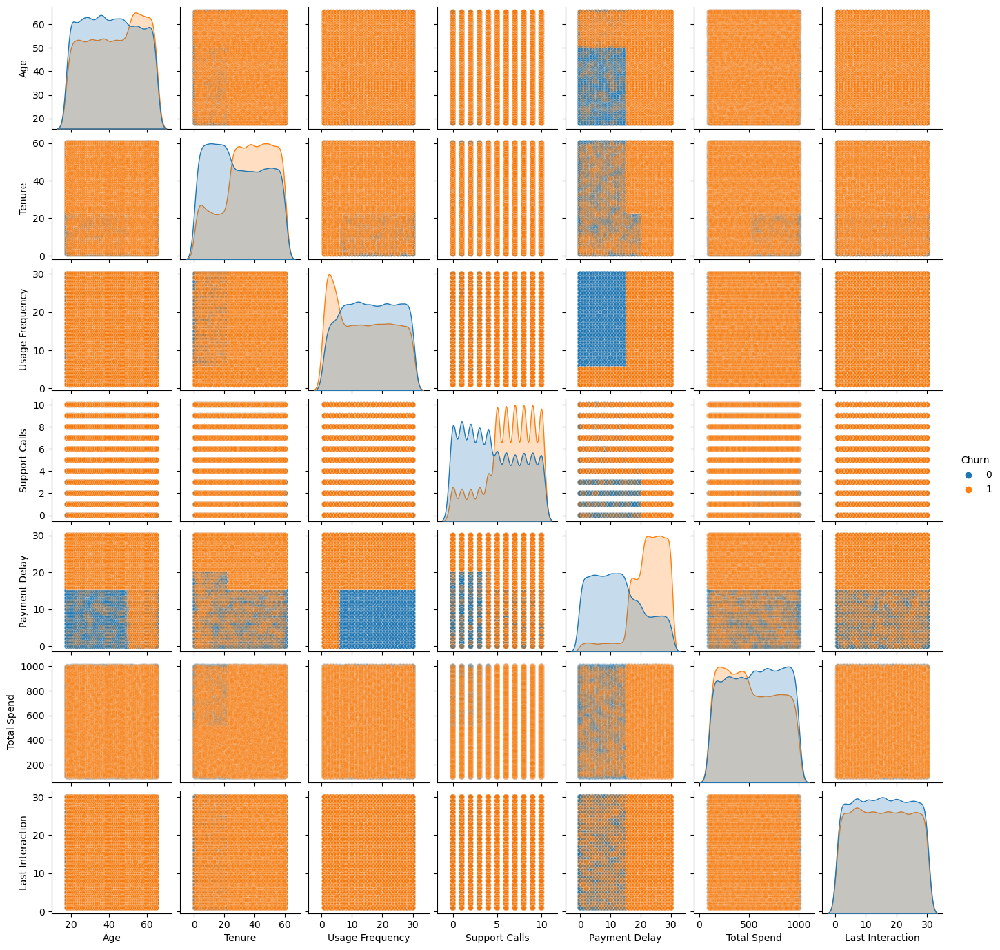

In [19]:
# Plot the list of columns which are numerical
sns.pairplot(data = data_testing, diag_kind = "kde", aspect = 1, height = 2, hue = 'Churn', plot_kws = dict(alpha = 0.1))
plt.show()

- There are few data scattered in CHURN

## Data preprocessing

In [20]:
# Separating independent and dependent variable
X = data_training.drop(['Churn'],axis=1)
X = pd.get_dummies(X,drop_first=True)
y = data_training['Churn']

In [21]:
X.head()

,Age,Tenure,Usage Frequency,Support Calls,Payment Delay,Total Spend,Last Interaction,Gender_Male,Subscription Type_Premium,Subscription Type_Standard,Contract Length_Monthly,Contract Length_Quarterly
0,30.0,39.0,14.0,5.0,18.0,932.0,17.0,False,False,True,False,False
1,65.0,49.0,1.0,10.0,8.0,557.0,6.0,False,False,False,True,False
2,55.0,14.0,4.0,6.0,18.0,185.0,3.0,False,False,False,False,True
3,58.0,38.0,21.0,7.0,7.0,396.0,29.0,True,False,True,True,False
4,23.0,32.0,20.0,5.0,8.0,617.0,20.0,True,False,False,True,False


In [22]:
# Splitting data into training, validation and test set:
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=1, stratify=y
)
print(f'X_train: {X_train.shape} - X_val {X_val.shape}')

X_train: (352665, 12) - X_val (88167, 12)


In [23]:
y_train.value_counts(normalize=True)

Churn
1.0    0.567108
0.0    0.432892
Name: proportion, dtype: float64

In [24]:
y_val.value_counts(normalize=True)

Churn
1.0    0.567106
0.0    0.432894
Name: proportion, dtype: float64

In [25]:
# Separating independent and dependent variable
X_test = data_testing.drop(['Churn'],axis=1)
X_test = pd.get_dummies(X,drop_first=True)
y_test = data_training['Churn']

In [26]:
print(f'X_test: {X_test.shape}')

X_test: (440832, 12)


In [27]:
X_test.head()

,Age,Tenure,Usage Frequency,Support Calls,Payment Delay,Total Spend,Last Interaction,Gender_Male,Subscription Type_Premium,Subscription Type_Standard,Contract Length_Monthly,Contract Length_Quarterly
0,30.0,39.0,14.0,5.0,18.0,932.0,17.0,False,False,True,False,False
1,65.0,49.0,1.0,10.0,8.0,557.0,6.0,False,False,False,True,False
2,55.0,14.0,4.0,6.0,18.0,185.0,3.0,False,False,False,False,True
3,58.0,38.0,21.0,7.0,7.0,396.0,29.0,True,False,True,True,False
4,23.0,32.0,20.0,5.0,8.0,617.0,20.0,True,False,False,True,False


In [28]:
y_test.value_counts(normalize=True)

Churn
1.0    0.567107
0.0    0.432893
Name: proportion, dtype: float64

### Model building

In [29]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Logistic Regression", LogisticRegression(random_state=1)))
models.append(("Decision Tree Classifier", DecisionTreeClassifier(random_state=1)))
models.append(("Bagging Classifier", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("Gradient Boosting Classifier", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models

# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")

for name, model in models:
    scoring = {
        'accuracy': make_scorer(accuracy_score),
        'precision': make_scorer(precision_score, average='macro'),
        'recall': make_scorer(recall_score, average='macro'),
        'f1': make_scorer(f1_score, average='macro'),
    }

    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5

    cv_result = cross_validate(estimator=model, X=X_train, y=y_train, scoring=scoring, cv=kfold)
    df_scores = pd.DataFrame(cv_result)
    print(f'\n {name} \n')
    print(df_scores.mean().round(4), '\n')
    


Cross-Validation Performance:


 Logistic Regression 

fit_time          1.9837
score_time        0.1418
test_accuracy     0.8801
test_precision    0.8772
test_recall       0.8801
test_f1           0.8784
dtype: float64 


 Decision Tree Classifier 

fit_time          0.6533
score_time        0.0997
test_accuracy     0.9998
test_precision    0.9997
test_recall       0.9997
test_f1           0.9997
dtype: float64 


 Bagging Classifier 

fit_time          4.5829
score_time        0.1563
test_accuracy     0.9998
test_precision    0.9998
test_recall       0.9998
test_f1           0.9998
dtype: float64 


 Random forest 

fit_time          20.2285
score_time         0.5785
test_accuracy      0.9993
test_precision     0.9992
test_recall        0.9994
test_f1            0.9993
dtype: float64 


 Gradient Boosting Classifier 

fit_time          86.3772
score_time         0.5669
test_accuracy      0.9971
test_precision     0.9967
test_recall        0.9975
test_f1            0.9971
dtype: floa

Logistic Regression


 Validation performance - Logistic Regression: 

   Accuracy   Recall  Precision        F1
0  0.853199  0.85818   0.879986  0.868946


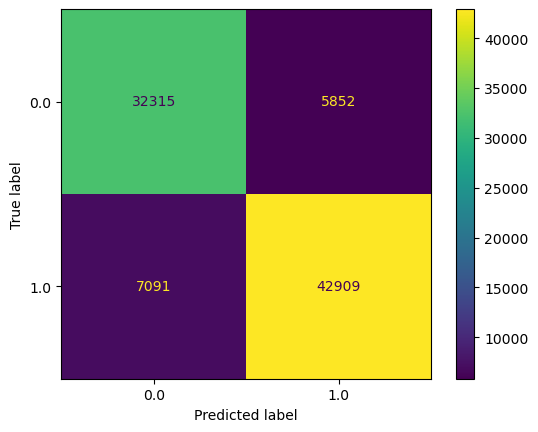

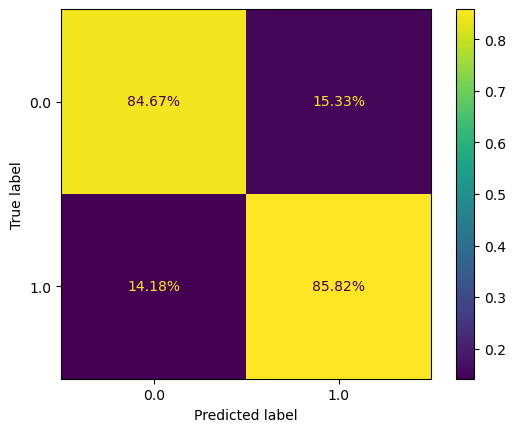


 Testing performance - Logistic Regression:

   Accuracy    Recall  Precision        F1
0  0.853311  0.858639   0.879808  0.869095


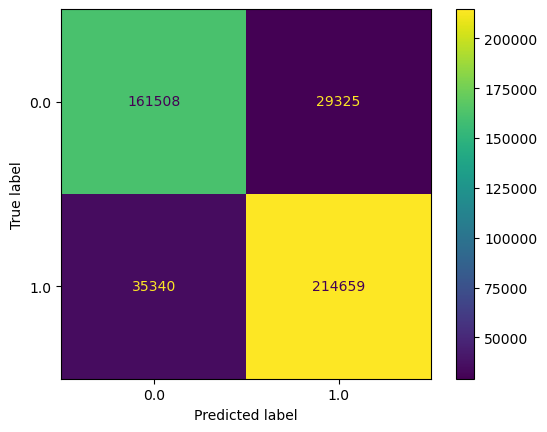

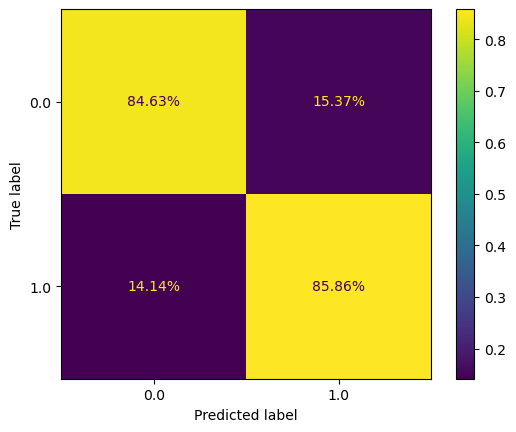

---------------------------------------- 

Decision Tree Classifier


 Validation performance - Decision Tree Classifier: 

   Accuracy   Recall  Precision       F1
0   0.99975  0.99984    0.99972  0.99978


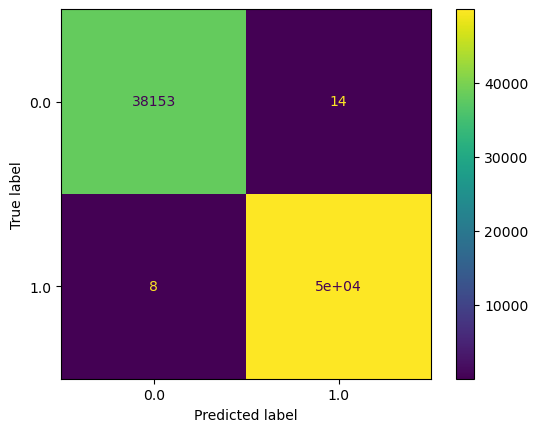

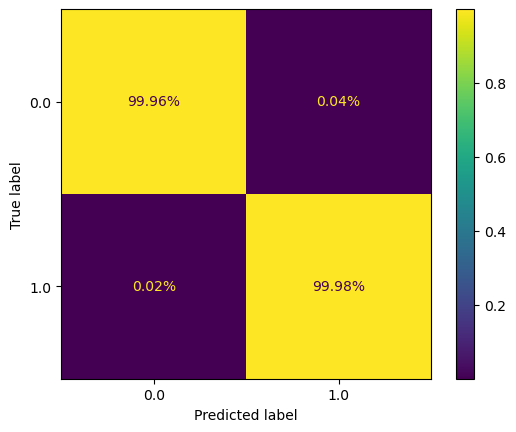


 Testing performance - Decision Tree Classifier:

   Accuracy    Recall  Precision        F1
0   0.99995  0.999968   0.999944  0.999956


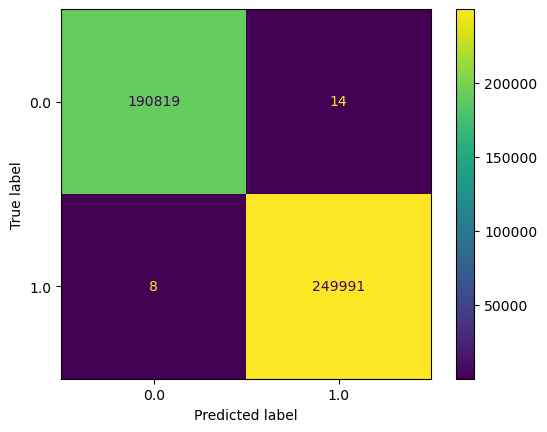

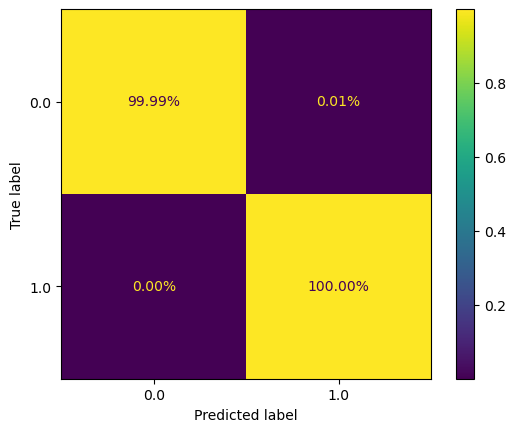

---------------------------------------- 

Bagging Classifier


 Validation performance - Bagging Classifier: 

   Accuracy  Recall  Precision      F1
0  0.999773  0.9997     0.9999  0.9998


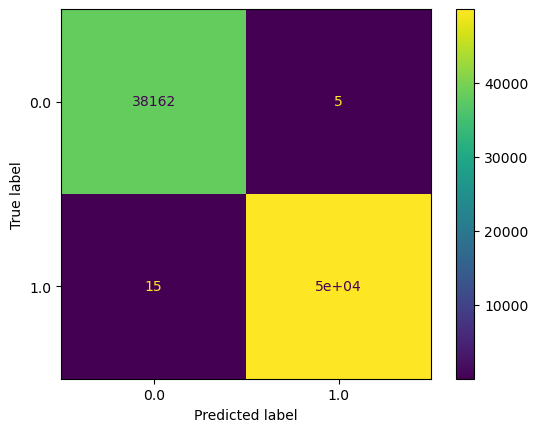

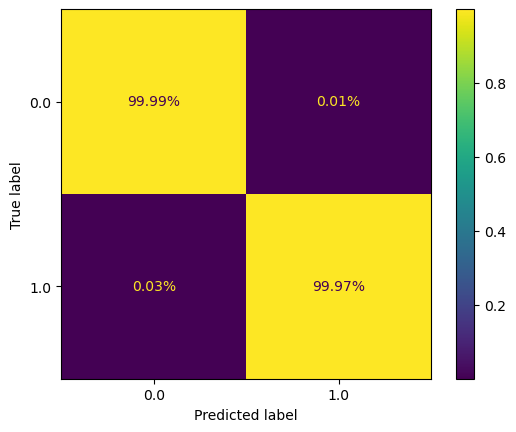


 Testing performance - Bagging Classifier:

   Accuracy    Recall  Precision        F1
0  0.999923  0.999884    0.99998  0.999932


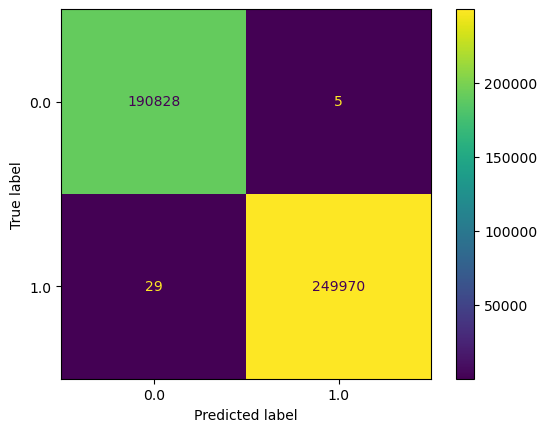

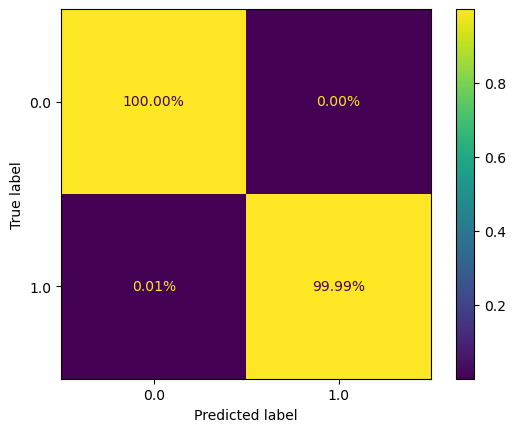

---------------------------------------- 

Random forest


 Validation performance - Random forest: 

   Accuracy   Recall  Precision      F1
0   0.99966  0.99948    0.99992  0.9997


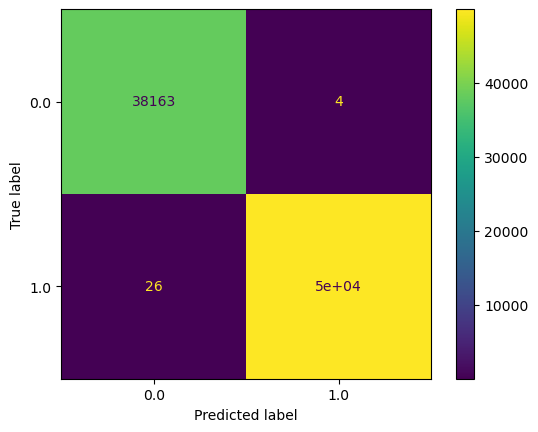

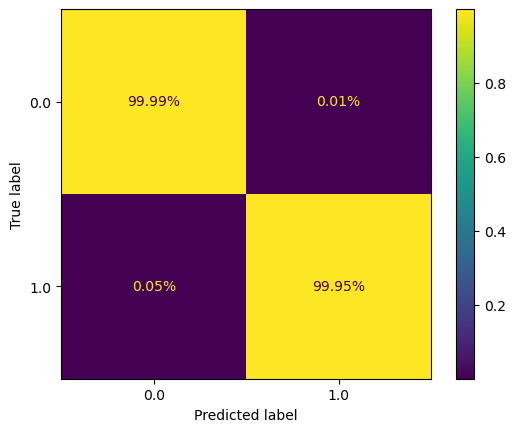


 Testing performance - Random forest:

   Accuracy    Recall  Precision       F1
0  0.999932  0.999896   0.999984  0.99994


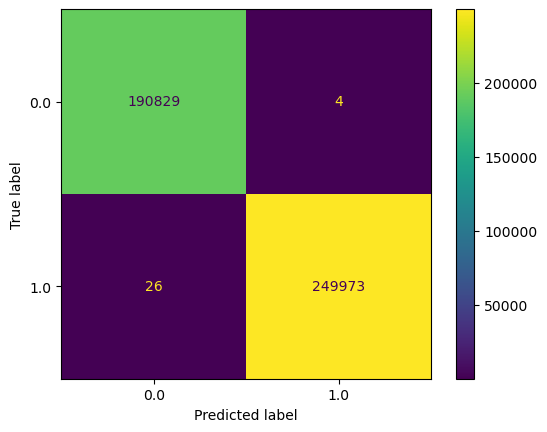

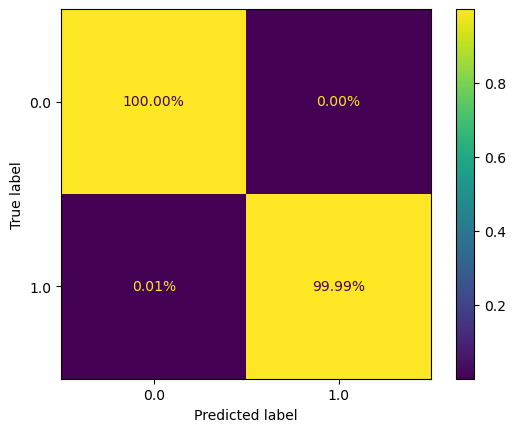

---------------------------------------- 

Gradient Boosting Classifier


 Validation performance - Gradient Boosting Classifier: 

   Accuracy   Recall  Precision        F1
0  0.996847  0.99452    0.99992  0.997212


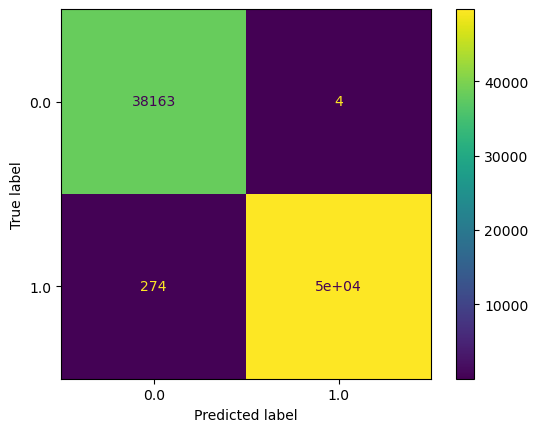

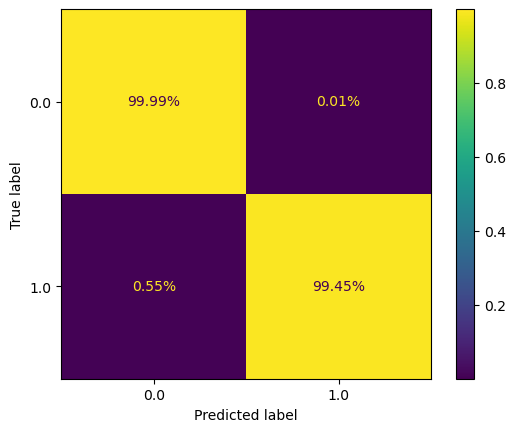


 Testing performance - Gradient Boosting Classifier:

   Accuracy   Recall  Precision       F1
0  0.996788  0.99436   0.999976  0.99716


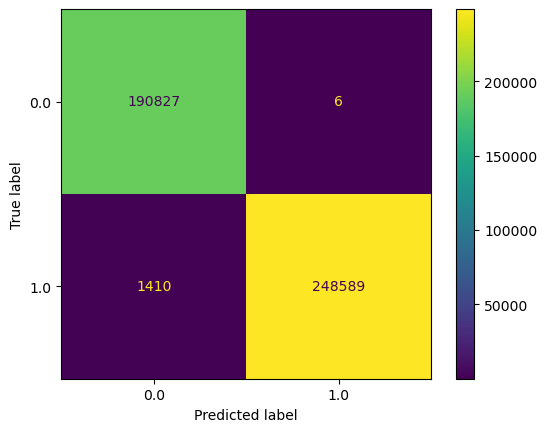

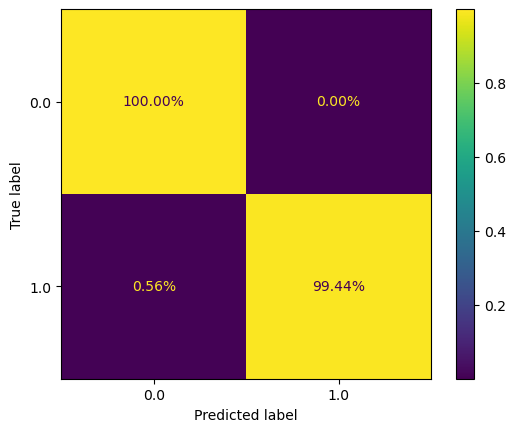

---------------------------------------- 

Adaboost


 Validation performance - Adaboost: 

   Accuracy   Recall  Precision        F1
0  0.983168  0.97374     0.9965  0.984989


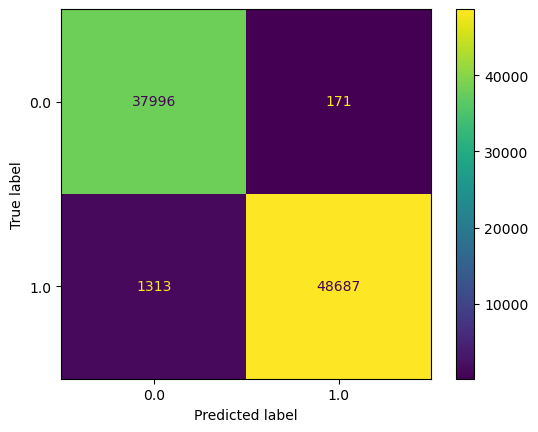

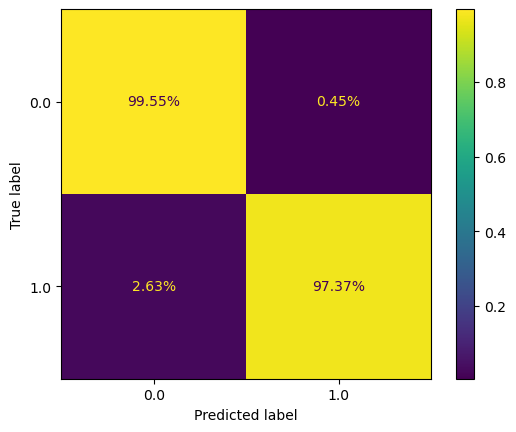


 Testing performance - Adaboost:

   Accuracy    Recall  Precision       F1
0  0.982696  0.972856    0.99655  0.98456


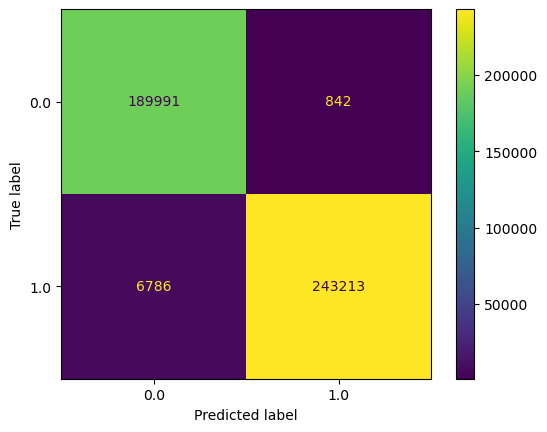

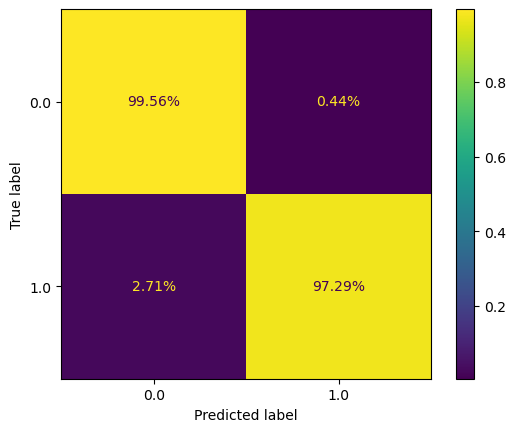

---------------------------------------- 



In [30]:
for name, model in models:
    model.fit(X_train, y_train)
    print(f'{name}\n')
    # Calculating different metrics on validation set
    print(f"\n Validation performance - {name}: \n")
    scores_val = model_performance_classification_sklearn(model, X_val, y_val)
    print(scores_val)
    disp = ConfusionMatrixDisplay.from_estimator(model, X_val, y_val, display_labels=model.classes_, normalize = None, ax=None)
    disp_norm = ConfusionMatrixDisplay.from_estimator(model, X_val, y_val, display_labels=model.classes_, normalize = 'true', ax=None, values_format=".2%")
    plt.show()

    # Calculating different metrics on validation set
    print(f"\n Testing performance - {name}:\n")
    scores_test = model_performance_classification_sklearn(model, X_test, y_test)
    print(scores_test)
    disp_test = ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, display_labels=model.classes_, normalize = None)
    disp_test_norm = ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, display_labels=model.classes_, normalize = 'true', ax=None, values_format=".2%")
    plt.show()
    print('-' * 40, "\n")

## Conclusion

- As the CHURN is well defined in the training dataset, the metrics are very high, when it's assessing testing and validating datasets.
- The best model to implement would be random forest.